# Setup Code

To begin, prepare the colab environment by clicking the play button below. This will install all dependencies for the future code and should take no more than 2 minutes. Make sure to also click `Runtime` on the top tab, then `Change Runtime Type` and make sure you are using a GPU runtime. The free tier of Google Colab will be sufficient but if you have access to a GPU we recommend you to download this notebook (File -> Download -> Download.ipynb) as Colab's resources are limited.

In [ ]:
!pip install gym==0.21.0 "setuptools>=62.3.0" pyglet
!pip install -v git+https://github.com/haosulab/ManiSkill2.git@cse291-0.4.0
!pip uninstall -y pathlib  # avoid overriding the builtin one
!pip uninstall -y sapien && pip install https://anaconda.org/jigu/sapien/2.0.0.dev20230112/download/sapien-2.0.0.dev20230112-cp38-cp38-manylinux2014_x86_64.whl
!cd ManiSkill2 && python setup.py develop

In [2]:
try:
    import google.colab
    IN_COLAB = True
except:
    IN_COLAB = False

if IN_COLAB:
    import site
    site.main() # run this so local pip installs are recognized

# CSE 291: Getting started with Gym Environments and Robotics

Welcome to CSE 291! This notebook is designed to get you started with some of the basic tools and code you will need for things in the course. It will cover some basic robotics, simulators/environments, visual data, and working with robotics demonstration datasets.

Research in robotics has often been difficult in the real world due to safety constraints and limited data. Robotics researchers often leverage simulators like [Mujoco](https://mujoco.org/), [Isaac-Gym](https://developer.nvidia.com/isaac-gym), or [Sapien](https://sapien.ucsd.edu/) to train and evaluate embodied agents in simulation. Simulators are much more scalable and provide a feasible alternative to real-world robotics training. We will be using the Sapien simulator and the associated environments in [ManiSkill2](https://github.com/haosulab/ManiSkill2) as they come with expert demonstrations of tasks and are fast for visual based methods.

Make sure to read every section and play around with the code and tools! Some general prerequisites is familarity with NumPy and general python programming.

We will also ask questions about these environments and demonstrations to test your knowledge. Questions will be marked with a "Q" and you can find all of them by clicking the Table of contents tab on the top left.

Lets first import some packages

In [3]:
# Import required packages
import gym
from tqdm.notebook import tqdm
import numpy as np
import mani_skill2.envs
import matplotlib.pyplot as plt

## 1 Environments

**Environments** define a world with agents, objects, etc. and moves forward in time using the underlying simulator. An environment effectively takes **actions** as input, steps forward one time step, and returns new **observations** (also referred to as state) as output.


Gym environments refers to an API established by OpenAI of a common interface between agents and environments. This api importantly defines two functions: `step(actions)` to step forward one timestep and `reset` to reset the environment to a clean state. Note that we will be using the original Gym API throughout the course. For those who are interested, the most up to date version is now called Gymnasium and is now maintained by the Farama foundation: https://github.com/Farama-Foundation/Gymnasium (who do great open-source RL work!)

The Gym API was designed originally with Reinforcement Learning in mind, where agents are trained by reinforcing positive actions and penalizing negative ones. As a result, environments will also return a **reward** signal indicating how well you are performing in an envrionment and a **done** signal indicating whether you have finished a task or not.




### 1.1 Understanding Observations and Actions

Every environment comes with an **observation space** and **action space**. The observation space defines the possible observations and the action space defines the possible actions. You can find more details on how spaces work to define mathematical sets here: https://gymnasium.farama.org/api/spaces/

We will play around with this in the following code cell which will render what you choose. Pick an environment, observation mode and control mode. The observation mode changes the observation space and the control mode changes the robotic controller which changes the action space. (no need to understand the code here just yet)


Action Space: Box([-1. -1. -1. -1.], [1. 1. 1. 1.], (4,), float32)


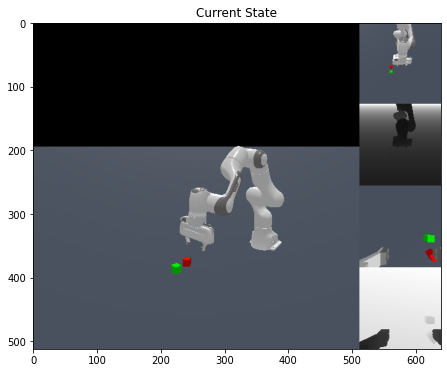

In [4]:
#@markdown Click the triangle to the left of the title to expand and see the code

# Can be any env_id from the list of Rigid-Body envs: https://github.com/haosulab/ManiSkill2/wiki/Rigid-Body-Environments
# and Soft-Body envs: https://github.com/haosulab/ManiSkill2/wiki/Soft-Body-Environments
env_id = "StackCube-v0" #@param can be one of ['PickCube-v0', 'PegInsertionSide-v0', 'StackCube-v0', 'PlugCharger-v0']

# choose an observation type and space, see https://github.com/haosulab/ManiSkill2/wiki/Observation-Space for details
obs_mode = "pointcloud" #@param can be one of ['pointcloud', 'rgbd', 'state_dict', 'state']

# choose a controller type / action space, see https://github.com/haosulab/ManiSkill2/wiki/Controllers for a full list
control_mode = "pd_ee_delta_pos" #@param can be one of ['pd_ee_delta_pose', 'pd_ee_delta_pos', 'pd_joint_delta_pos', 'arm_pd_joint_pos_vel']

reward_mode = "dense"

# create our environment with our configs and then reset to a clean state
env = gym.make(env_id, obs_mode=obs_mode, reward_mode=reward_mode, control_mode=control_mode)
obs = env.reset()

print("Action Space:", env.action_space)
# take a look at the current state
img = env.render(mode="cameras")
plt.figure(figsize=(10,6))
plt.title("Current State")
plt.imshow(img)
env.close() # close the environment and free up resources

In [5]:
#@title 1.1 Questions
#@markdown Please answer the following questions and fill in the fields. Some of them will require you dig through `env.observation_space` and `env.action_space`. Reading through https://github.com/haosulab/ManiSkill2/wiki/Observation-Space may help as well.

#@markdown How many dimensions are in the action space of the pd_ee_delta_pose controller?
pd_ee_delta_pose_dimensions = 6 #@param

#@markdown With the RGBD observation mode, how many cameras are there in the observation space?

rgbd_obs_mode_camera_count = 2 #@param

# #@markdown With the RGBD observation mode, what are the dimensions of the RGB images in both cameras?

# rgbd_obs_mode_image_shape = "h x w x c" #@param

# #@markdown With the Pointcloud observation mode, what are the dimensions of the Pointcloud?

# pcd_obs_mode_shape = "n x d" #@param

# #@markdown What do the dimensions of the Pointcloud observation mean (the xyzw key)? 

# pcd_dimensions = "enter your answer" #@param

### 1.2 Environment Interaction

Now lets dig into the code. With `gym` we can create environments using `gym.make(env_id: str)` and reset to a starting state with `env.reset()`. We can then step through the environment with `env.step(action)`. We also need something to generate the `action`, which we call `policy` in the code below. The policy is a function that takes an observation and returns an action.

If you aren't using Colab, the `env.render()` function will open a display window which renders the environment. Otherwise you can watch the saved videos

With this api, the usual interaction loop looks like this:

```python
env = gym.make(env_id)

obs = env.reset()

for i in range(1000):
    action = policy(obs)
    obs, reward, done, info = env.step(action)
    env.render()
    if done:
        obs = env.reset()

```

Notice that `env.reset` returns an observation named `obs`. This is the first observation. From here, we get an action by using the `obs`, submit the action to the environment via `env.step` and get a new updated `obs`. You might notice that because of this loop, for `N` actions there will be `N+1` observations. Typically once an episode (one loop until done=True) finishes, the final extra observation is known as the temrinal observation.

`env.step` returns a number of things. `obs` is the next observation. `reward` is a scalar value defined by the environment. 

`done` is whether the current episode is completed. Read the code below to see when done might be true, it's quite ambiguous! 

`info` contains miscellaneous information, which may often contain things such as the elapsed number of steps since the last `env.reset()` call or whether the current state is successful or not.


Read the following code under the `play` function to see in practice how we interact with an environment and what each of these things do

In [6]:
from mani_skill2.utils.wrappers import RecordEpisode
from IPython.display import Video
def play(env, policy, steps=100):
    # reset environment to a clean state
    obs = env.reset()

    for i in tqdm(range(steps)):
        # repeatedly sample actions from the policy function
        action = policy(obs)
        # step through the environment and save the new observation, reward, done, and additional information
        obs, reward, done, info = env.step(action)
        if not IN_COLAB: env.render() # will render with a window if possible
        if done:
            # whenever an env is done, either we have succeeded or 
            # perhaps have entered a failed state. Any case, we will reset the env
            # Failure states usually mean we reached a time_limit (default is 200 steps here)
            # or the robot has entered some irrecoverable state that the environemnt defines as needing a reset
            obs = env.reset()

Now lets try running some random actions. Feel free to change env_id to other environment names to move in them randomly as well.

In [7]:
env_id = "LiftCube-v0"
# create environment
env = gym.make(env_id)
# for Colab users we wrap an environment wrapper to auto save videos, no need to learn how RecordEpisode works
env = RecordEpisode(env, "./videos", render_mode="cameras", info_on_video=True)
def policy(obs):
    # sample random actions from the action space
    return env.action_space.sample()
play(env, policy, steps=100)

# Save the video
env.flush_video()
# close the environment and release resources
env.close()
Video("./videos/0.mp4", embed=True) # Watch our replay

2023-02-02 20:11:32,321 - mani_skill2 - WARNING - mani_skill2 is not installed with git.


  0%|          | 0/100 [00:00<?, ?it/s]

In [8]:
#@title 1.2 Questions
#@markdown Please answer the following questions and fill in the fields.

#@markdown During environment interaction, the policy function generates actions from observations. Where are these observations from? 
q12_1 = 'env.reset or env.step' #@param ['select answer', 'they were dreamed', 'env.reset or env.step', 'the initial env.reset output', 'from the policy itself']

#@markdown When done is True, what does that mean? List some of the meanings. You may notice that there are quite a few and it's quite ambiguous!
q12_2 = 'It means the roll-out of this experiment is finished. It could be the job of getting the cubes is successful. Or the arm failed in getting cubes. Or the arm is in abnormal state. All cases need to be terminated by setting done to true.' #@param {type:"string"}

#@markdown Using the above interaction loop, how many different `obs` are there if we generated `N` actions and ran `env.step` `N` times?
q12_3 = "N+1" #@param ['select answer', 'N', 'N-1', 'N+1']

## 2 Robotics

Section 1 has shown how to create environments and step through them randomly. But now we want to understand the robotics side of things! We will go through more in depth on visual observations, the different controllers, as well as understanding robot states.

CSE 291 will cover some of the more specific details such as how joints and links work, how to control them etc. This section will mainly go over the programming side of things on those topics and get you comfortable.

### 2.1 Robot Arms and Controllers

In the previous videos and images we have shown an robot, specifically a robot arm + gripper. Robot arms are often used as a flexible piece of hardware that can perform a number of tasks that involve grasping.

Now the robot at the low level has each of it's joint controlled via control signals. The control signals are produced via the actions we give to the environment.

For more details see https://github.com/haosulab/ManiSkill2/wiki/Controllers


#### 2.1.1 Joint Controllers

Joint controllers are typically the most low-level form of control of a robot arm. In real robot arms, humans can only program and control a robot by changing the configuration of each joint. 

Typically joint is configured by rotation if its a [revolute joint](https://en.wikipedia.org/wiki/Revolute_joint) or by translation if it's a [prismatic joint](https://en.wikipedia.org/wiki/Prismatic_joint). The current configuration of the robot can found with `env.agent.get_state()` which gives the `qpos`, also known as configuration position. In particular, the `pd_joint` prefixed controllers will generally control the first 8 dimensions of the robot state.

The following code and questions will ask about `pd_joint_delta_pos` and `pd_joint_pos` but there are additional more complex ways of controlling joints e.g. via target velocities and positions.

The following cell experiments allows experimenting with different joint controllers and seeing what they do.

In [53]:
env_id = "LiftCube-v0"
control_mode = "pd_joint_delta_pos"
env = gym.make(env_id, control_mode=control_mode)
env = RecordEpisode(env, "./videos", render_mode="cameras", info_on_video=True)
print(env.action_space.shape)
def policy(obs):
    action = np.zeros(env.action_space.shape) # create an empty action
    action[5] = -1
    return action
play(env, policy, steps=100)
env.flush_video()
env.close()
Video("./videos/0.mp4", embed=True)

2023-02-02 20:42:31,856 - mani_skill2 - WARNING - mani_skill2 is not installed with git.


(8,)


  0%|          | 0/100 [00:00<?, ?it/s]

In [50]:
#@title 2.1.1 Questions
#@markdown Now it's your turn to experiment and learn. 
#@markdown The above code and the documentation at 
#@markdown https://github.com/haosulab/ManiSkill2/wiki/Controllers will be helpful.
#@markdown the following questions under each heading assume that particular `control_mode`

#@markdown ### pd_joint_delta_pos

#@markdown What does a zero action mean with this controller? 
q211_1 = "No action of revolute joints at the beginning. The prismatic joint moving a little bit." #@param {type:"string"}

#@markdown Experiment with the code above. Which dimension(s) controls a revolute joint? 
q211_2 = "The first 6 dimensions." #@param {type:"string"}

#@markdown Which dimension(s) controls a prismatic joint? What part of the robot does it control?
q211_3 = "The last dimension. Two gripper fingers." #@param {type:"string"}

#@markdown ### pd_joint_pos
#@markdown What does a zero action mean with this controller? 
q211_4 = "The robot arm is erect. " #@param {type:"string"}

#@markdown Bonus: Can you find the action choice that makes the robot stay near its rest position?
#@markdown Write the code to do so below:

env_id = "LiftCube-v0"
control_mode = "pd_joint_pos"
env = gym.make(env_id, control_mode=control_mode)
env = RecordEpisode(env, "./videos", render_mode="cameras", info_on_video=True)
def policy(obs):
    action = np.zeros(env.action_space.shape)
    ### Write your code for the bonus question here
    # hint: env.agent.get_state() has some useful information
    action=np.array([-0.02336664,0.36680603, -0.01309012, -1.954156,0.01753465,2.3889859,0.8230239,0.04 ])
    return action
play(env, policy, steps=100)
env.flush_video()
# close the environment and release resources
env.close()
Video("./videos/0.mp4", embed=True) # Watch our replay

2023-02-02 20:39:01,417 - mani_skill2 - WARNING - mani_skill2 is not installed with git.


  0%|          | 0/100 [00:00<?, ?it/s]

#### 2.1.2 End-Effector / Position Controllers

To the physical robot, joint controllers are intuitive and direct as they directly control the individual movable joints. But for humans and AI models, this is not an intuitive controller interface. One solution is position control of which ManiSkill2 environments support.

In robotics, the end-effector typically refers to the device attached to the end of a robot arm like the two finger gripper seen before. An intuitive way to then control a robot is to simply tell it to move its end-effector in xyz space (and optionally control the rotation via 6D-pose). It's much easier to tell the arm to move along the y-axis 100cm compared to telling it to rotate joint 1 a little, joint 2 a little etc.

The `pd_ee_delta_pos` controller controls the end-effector positionally (xyz space) while the `pd_ee_delta_pose` controller controls position and rotation in 6D-pose space. These controllers are built upon [inverse-kinematics](https://en.wikipedia.org/wiki/Inverse_kinematics) that product joint signals based on desired positions of the end-effector.



In [59]:
env_id = "LiftCube-v0"
control_mode = "pd_ee_delta_pose"
env = gym.make(env_id, control_mode=control_mode)
env = RecordEpisode(env, "./videos", render_mode="cameras", info_on_video=True)
print(env.action_space.shape)
def policy(obs):
    action = np.zeros(env.action_space.shape)
    action[3] = -1
    return action
play(env, policy, steps=100)
env.flush_video()
# close the environment and release resources
env.close()
Video("./videos/0.mp4", embed=True) # Watch our replay

2023-02-02 20:50:36,611 - mani_skill2 - WARNING - mani_skill2 is not installed with git.


(7,)


  0%|          | 0/100 [00:00<?, ?it/s]

In [12]:
#@title 2.1.2 Questions
#@markdown Now it's your turn to experiment (again).
#@markdown The above code and the documentation at 
#@markdown https://github.com/haosulab/ManiSkill2/wiki/Controllers will be helpful.
#@markdown the following questions under each heading assume that particular `control_mode`

#@markdown ### pd_ee_delta_pos

#@markdown There are 4 dimensions in this controller. The first three control x, y, and z translational movements while the last one controls the open and closing of the gripper. In robotics we typically denote this axis as the "up-down" axis. Which one is it?
q212_1 = "z" #@param ['select answer', 'x', 'y', 'z']

#@markdown In machine learning, less dimensions typically means easier learning. This controller has 3 dimensions which is great, but what's one drawback of this in the context of robotics and manipulating objects?
q212_2 = "The end-effector only has translational movements. But sometimes it need to rotate a little a bit to pick up objects. The drawback is the lack of rotational control. " #@param {type:"string"}

#@markdown ### pd_ee_delta_pose
#@markdown This controller adds 3 new dimensions. What do they control?
q212_3 = "The rotations along x,y,z axes of ee or base frame." #@param {type:"string"}
#@markdown While this adds in rotational control to the end-effector, for some tasks this type of control might not be sufficient. What kind of tasks would be impossible to solve using this controller?
q212_4 = "Pick up objects with various weights. The strength may not be enough for heavy objects. It should be controlled." #@param {type:"string"}

### 2.2 Visual Observations

So we know how to control an arm, but we can't control it blindly! In order to train strong, generalizable robots, visual observations enable a robot to reason about the world like humans and is not limited to a specific environment.

This section will cover RGBD (RGB colors and Depth information) and Pointcloud observations and detail how to work with them.

#### 2.2.1 RGBD Observations

RGBD contains both RGB colors and depth information, with a RGBD "image" resulting in a shape of `(H x W x 4)`.

In ManiSkill2 environments, there are always two cameras, a `base_camera` and a `hand_camera` attached to the end-effector. The show_camera_view function below is a simple way to display what the captured RGB and depth images are like

[[-0. -0. -0. -0.]
 [-0. -0. -0. -0.]
 [-0. -0. -0. -0.]
 [-0. -0. -0. -0.]]
[[0.2614849  0.2614045  0.26132417 0.26124388]
 [0.26130357 0.26122332 0.2611431  0.26106292]
 [0.26112252 0.26104236 0.26096225 0.2608822 ]
 [0.2609417  0.26086167 0.26078168 0.26070172]]


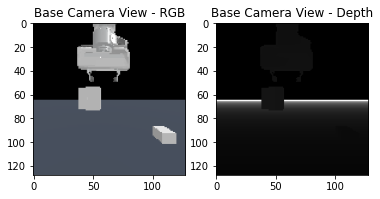

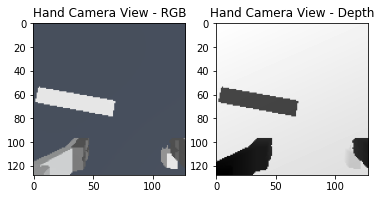

In [62]:
def show_camera_view(obs_camera, title):
    plt.figure()
    rgb, depth = obs_camera['rgb'], obs_camera['depth']
    plt.subplot(1,2,1)
    plt.title(f"{title} - RGB")
    plt.imshow(rgb)
    plt.subplot(1,2,2)
    plt.title(f"{title} - Depth")
    plt.imshow(depth[:,:, 0], cmap="gray")
    print(depth[1:5,1:5, 0])

env_id = "PlugCharger-v0"
control_mode = "pd_ee_delta_pose"
env = gym.make(env_id, control_mode=control_mode, obs_mode="rgbd")
obs = env.reset() # reset env and generate an observation
# display the RGBD observations
show_camera_view(obs['image']['base_camera'], "Base Camera View")
show_camera_view(obs['image']['hand_camera'], "Hand Camera View")

We also provide intrinsic and extrinsic camera matrices which allow one to know where the image was taken and its orientation relative to different frames (e.g. the world frame).

In [61]:
for camera_name in obs['camera_param'].keys():
    params = obs['camera_param'][camera_name]
    print(f"{camera_name} extrinsic\n", params['extrinsic_cv'])
    print(f"{camera_name} intrinsic\n", params['intrinsic_cv'])

base_camera extrinsic
 [[ 0.  -1.   0.   0. ]
 [ 0.   0.  -1.   0.1]
 [ 1.   0.   0.   0.3]
 [ 0.   0.   0.   1. ]]
base_camera intrinsic
 [[64.  0. 64.]
 [ 0. 64. 64.]
 [ 0.  0.  1.]]
hand_camera extrinsic
 [[ 0.04122755 -0.9989782  -0.01851613  0.04603412]
 [-0.99830866 -0.04042551 -0.04178077  0.0586086 ]
 [ 0.04098952  0.02020733 -0.99895525  0.24277903]
 [ 0.          0.          0.          1.        ]]
hand_camera intrinsic
 [[64.05098  0.      64.     ]
 [ 0.      64.05098 64.     ]
 [ 0.       0.       1.     ]]


In [15]:
#@title 2.2.1 Questions
#@markdown Answer the following questions about the RGBD observations. https://github.com/haosulab/ManiSkill2/wiki/Observation-Space will be useful to answer some questions.

#@markdown In the hand camera depth image, what do the darker colors represent?
q221_1 = "Invalid pixels." #@param {type:"string"}

#@markdown In the base camera depth image data there are 0s in it. What do they reference to?
q221_2 = "The background or ground." #@param {type:"string"}

#@markdown When interacting with an environment, you may notice that the hand_camera extrinsic is constantly changing. Why is that?
q221_3 = "The end-effector is changing. So the hand_camera extrinsic is changing with respect to base frame." #@param {type:"string"}

#### 2.2.2 Pointcloud Observations

Pointclouds are another form of representation of 3D data of shape `N x 3` and generally assume a set-like structure where the order of points has no meaning.

They are also a promising observation format to learn from via architectures like [PointNet](https://arxiv.org/abs/1612.00593) that typically process and understand 3D geometry better than 2D computer vision models. Read the code below to see how we use the [trimesh](https://trimsh.org/) package to process and display a pointcloud for viewing. The interactive pointcloud viewer is controlled with the scroll wheel (zoom), left click (rotate), and right click (pan).

Note that ManiSkill2 pointcloud observations are of shape `N x 4`, where the extra 4th dimension is a boolean encoding whether or not the point is infinite or not.

In [16]:
def show_pointcloud(obs):
    import trimesh
    # we load the points and the colors of each point
    pts = obs['pointcloud']['xyzw'][::,:3]
    colors = obs['pointcloud']['rgb']
    s = trimesh.Scene([trimesh.points.PointCloud(pts, colors)])
    return s.show()

env_id = "StackCube-v0"
control_mode = "pd_ee_delta_pose"
env = gym.make(env_id, control_mode=control_mode, obs_mode="pointcloud")
obs = env.reset() # reset env and generate an observation
# display the Pointcloud observation
show_pointcloud(obs)

You may also notice that unlike RGBD observations, there isn't specific data for each camera in the observation. Point clouds effectively merge all the 3D data into one matrix in the world frame. This is made a little obvious by how some parts of the point cloud above looks denser and that's because two cameras were pointed at them.

Since it's in the world frame, this makes working and learning from PointClouds fairly easy. Below shows a simple example of how to segment out the ground plane and only keep the objects and the robot. This would take a bit of extra work to do with RGBD data as you would need to transform the pixels and depth data into the world frame using the camera matrices.

In [17]:
env_id = "StackCube-v0"
control_mode = "pd_ee_delta_pose"
env = gym.make(env_id, control_mode=control_mode, obs_mode="pointcloud")
obs = env.reset() # reset env and generate an observation
# display the Pointcloud observation
filter = obs['pointcloud']['xyzw'][::,2] > 0
obs['pointcloud']['xyzw'] = obs['pointcloud']['xyzw'][filter]
obs['pointcloud']['rgb'] = obs['pointcloud']['rgb'][filter] 
show_pointcloud(obs)

In [71]:
#@title 2.2.2 Questions
#@markdown Answer the following question about the PointCloud observations. https://github.com/haosulab/ManiSkill2/wiki/Observation-Space may be useful to answer some questions.

#@markdown Code a filter that segments out everything but the red block in the StackCube environment. Fill in the code below
env_id = "StackCube-v0"
control_mode = "pd_ee_delta_pose"
env = gym.make(env_id, control_mode=control_mode, obs_mode="pointcloud")
obs = env.reset() # reset env and generate an observation
# display the Pointcloud observation
#filter = obs['pointcloud']['xyzw'][::,2] > 0 # replace with your own filter
print(obs['pointcloud']['rgb'].shape)
thre = 100
filter = (obs['pointcloud']['rgb'][:,0]>thre) * (obs['pointcloud']['rgb'][:,2]<thre) 
obs['pointcloud']['xyzw'] = obs['pointcloud']['xyzw'][filter]
obs['pointcloud']['rgb'] = obs['pointcloud']['rgb'][filter] 

show_pointcloud(obs)

(32768, 3)


## 3 Using Robotic Demonstrations

The following code will go through the basic usage of our large-scale robotics demonstration dataset. Demonstrations enable Learning from Demonstrations (LfD) approaches which show promise in speeding up training compared to pure online RL and may enable better generalization at scale. 

While RL enables an agent to learn beyond the constraints of a dataset and potentially rely less on expert guidance, it still remains sample inefficient and slow compared to traditional supervised-learning based methods to solve these robotics tasks (such as Behavior Cloning).

This section will simply cover how to download, load, and view the demonstrations dataset which will come into use in the future.

### 3.1 Download and load


Each environment comes with a `.h5` file composed of all the demonstrations. Moreover, each `.h5` file has an associated `.json` file defining the environment configuration used in those demonstrations. We provide a simple command line tool to download demos. Specify an output folder and environment ID and it will download the appropriate demonstrations

In [19]:
env_id = "StackCube-v0" #@param can be one of ['PickCube-v0', 'PegInsertionSide-v0', 'StackCube-v0', 'PlugCharger-v0']


In [20]:
# We provide a command line tool to download demonstrations.
!python -m mani_skill2.utils.download_demo {env_id} -o "demos"

Retrieving folder list
Processing file 1HqY3sgoAMV7DtJR_CcYstzFJlpm80e5J trajectory.h5
Processing file 1CONEvPUHNNQXGdCOaEc3iTOPZFLyqbTb trajectory.json
Retrieving folder list completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1HqY3sgoAMV7DtJR_CcYstzFJlpm80e5J
To: /content/demos/rigid_body/StackCube-v0/trajectory.h5
100% 47.9M/47.9M [00:00<00:00, 134MB/s]
Downloading...
From: https://drive.google.com/uc?id=1CONEvPUHNNQXGdCOaEc3iTOPZFLyqbTb
To: /content/demos/rigid_body/StackCube-v0/trajectory.json
100% 365k/365k [00:00<00:00, 158MB/s]
Download completed


To load the demonstration dataset, we use h5py and a load_json utility

In [21]:
import h5py
from mani_skill2.utils.io_utils import load_json

# Load the trajectory data from the .h5 file
traj_path = f"demos/rigid_body/{env_id}/trajectory.h5"
h5_file = h5py.File(traj_path, "r")

# Load associated json
json_path = traj_path.replace(".h5", ".json")
json_data = load_json(json_path)

episodes = json_data["episodes"]  # meta data of each episode
env_info = json_data["env_info"]
env_id = env_info["env_id"]
env_kwargs = env_info["env_kwargs"]

print("env_id:", env_id)
print("env_kwargs:", env_kwargs)
print("#episodes:", len(episodes))

env_id: StackCube-v0
env_kwargs: {'obs_mode': 'none', 'control_mode': 'pd_joint_pos'}
#episodes: 1000


The trajectory of each episode is stored under the `traj_{episode_id}` key in the HDF5 file. `episode_id` usually ranges from 0 to `len(episodes) - 1`.
`episode_id` and other meta information of episdoes are stored under the `episodes` key in the JSON file.
The raw trajectory contains 3 keys: `actions`, `env_states` and `success`. For soft-body environments, `env_states` is replaced by `env_init_state` (initial state) to reduce data storage.

In [22]:
traj_id = "traj_0"
traj_h5 = h5_file[traj_id]
for key in traj_h5:
    print(key, traj_h5[key].shape, traj_h5[key].dtype)

actions (126, 8) float32
env_states (127, 70) float32
success (126,) bool


**Note that the raw trajectories do not include actual observations.** We store both actions and environment states, which can be used to replay trajectories and generate desired observations (states, RGBD images, point cloud). Section 3.3 goes over a simple tool that adds desired observations.

### 3.2 Replay demonstrations

To replay the trajectory of an episode, you need to first create an environment given the environment initialization keyword arguments stored in the JSON file. Additionally, you need to reset the environment with the same seed and other keyword arguments of the episode recorded in the JSON file. Then, the trajectory can be replayed by actions or environment states stored in the HDF5 file.

The function below will allow you to save a video and if possible render a display window of a demonstration.

In [23]:
def replay(episode_idx, h5_file, json_data, render_mode="cameras", fps=20):
    episodes = json_data["episodes"]
    ep = episodes[episode_idx]
    # episode_id should be the same as episode_idx, unless specified otherwise
    episode_id = ep["episode_id"]
    traj = h5_file[f"traj_{episode_id}"]

    # Create the environment
    env_kwargs = json_data["env_info"]["env_kwargs"]
    env = gym.make(env_id, **env_kwargs)
    # Reset the environment
    reset_kwargs = ep["reset_kwargs"].copy()
    reset_kwargs["seed"] = ep["episode_seed"]
    env.reset(**reset_kwargs)

    frames = [env.render(mode=render_mode)]

    for i in tqdm(range(len(traj["actions"]))):
        action = traj["actions"][i]
        obs, reward, done, info = env.step(action)
        if not IN_COLAB: env.render()
        frames.append(env.render(mode=render_mode))
    
    env.close()
    del env
    return frames

In [24]:
from mani_skill2.utils.visualization.jupyter_utils import display_images

episode_idx = 3 #@param {type:"integer"}
frames = replay(episode_idx, h5_file, json_data)
display_images(frames, format="jshtml",  repeat=True, cache_frame_data=False, interval=50)

  0%|          | 0/166 [00:00<?, ?it/s]

### 3.3 Convert demonstrations

The demonstration dataset does not include actual observations. You can convert trajectories to a desired observation space and action space with the below tool.

```python
# Replay the trajectory to `rgbd` observations and the `pd_ee_delta_pose` controller with 10 processes in parallel
python -m mani_skill2.trajectory.replay_trajectory --traj-path demos/rigid_body/PickCube-v0/trajectory.h5 --save-traj --obs-mode rgbd --target-control-mode pd_ee_delta_pose --num-procs 10
```

This will come in handy in the future when we start looking into robotic learning with Reinforcement Learning and Learning from Demonstrations

## 4 Final Thoughts

We hope this notebook got you familiar with the ManiSkill2 environments and robotics in general. There's a ton of room for things to do with the software and data available.

Finally, please fill out this feedback form so we can iterate and improve this tutorial: https://forms.gle/RQGqCLaBwm7MNHGh6
